# Soil Classification Challenge 2

This project tackles the problem of identifying whether a given image contains soil or not, using computer vision techniques. The challenge is approached as a one-class classification (anomaly detection) task, where only soil-class images are used for training. 

After exploring various strategies, the most effective solution was found to be based on extracting high-dimensional embeddings from images using pretrained models (Vision Transformers and TinyVGG), and then classifying test images by measuring their cosine similarity to known soil embeddings. The decision threshold is tuned based on the distribution of distances among soil images.

This notebook documents the approach, model loading, data processing, evaluation, and results.

In [2]:
import sys
import os
src_path = os.path.abspath(os.path.join(os.getcwd(), '..', '..', 'src'))
if src_path not in sys.path:
    sys.path.append(src_path)

In [3]:
import pandas as pd
from torchvision import transforms
from torch.utils.data import DataLoader

from essentials import TinyVGG_FeatureExtractor, TestImageDataset, TrainImageDataset, ModelLoader, Evaluation

## Tiny VGG Model

In [28]:
tinyvgg = ModelLoader(
    'tinyvgg',
    '../../models/tinyvgg_model_state_dict.pth'
).pipeline_initiate(TinyVGG_FeatureExtractor)
tinyvgg

TinyVGG_FeatureExtractor(
  (conv_block_1): Sequential(
    (0): Conv2d(3, 10, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3))
    (1): ReLU()
    (2): Conv2d(10, 10, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3))
    (3): ReLU()
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (conv_block_2): Sequential(
    (0): Conv2d(10, 10, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3))
    (1): ReLU()
    (2): Conv2d(10, 10, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3))
    (3): ReLU()
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (flatten): Flatten(start_dim=1, end_dim=-1)
)

# ViT Model

In [30]:
vit = ModelLoader('vit', '../../models/vit_model_state_dict.pth').pipeline_initiate()
vit

VisionTransformer(
  (conv_proj): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
  (encoder): Encoder(
    (dropout): Dropout(p=0.0, inplace=False)
    (layers): Sequential(
      (encoder_layer_0): EncoderBlock(
        (ln_1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (self_attention): MultiheadAttention(
          (out_proj): NonDynamicallyQuantizableLinear(in_features=768, out_features=768, bias=True)
        )
        (dropout): Dropout(p=0.0, inplace=False)
        (ln_2): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (mlp): MLPBlock(
          (0): Linear(in_features=768, out_features=3072, bias=True)
          (1): GELU(approximate='none')
          (2): Dropout(p=0.0, inplace=False)
          (3): Linear(in_features=3072, out_features=768, bias=True)
          (4): Dropout(p=0.0, inplace=False)
        )
      )
      (encoder_layer_1): EncoderBlock(
        (ln_1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (self_a

## Dataset, Transforms and Dataloader

Note : Transforms are same as that of during training the model in Soil Chalenge #1

### Transforms

In [ ]:


transform = transforms.Compose(
    [
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ]
)

### Train Image Dataset

In [9]:
train_csv_path = "../../data/soil_competition-2025/train_labels.csv"
train_df = pd.read_csv(train_csv_path)
train_df.head()


,image_id,label
0,img_ed005410.jpg,1
1,img_0c5ecd2a.jpg,1
2,img_ed713bb5.jpg,1
3,img_12c58874.jpg,1
4,img_eff357af.jpg,1


In [10]:
train_images_dir = "../../data/soil_competition-2025/train"

dataset_train = TrainImageDataset(train_images_dir, transform=transform)
train_dataloader = DataLoader(dataset_train, batch_size=32, shuffle=False)


### Test Image Dataset

In [11]:
test_csv_path = "../../data/soil_competition-2025/test_ids.csv"

test_df = pd.read_csv(test_csv_path)
test_df.head()

,image_id
0,6595f1266325552489c7d1635fafb88f.jpg
1,4b614841803d5448b59e2c6ca74ea664.jpg
2,ca30e008692a50638b43d944f46245c8.jpg
3,6a9046a219425f7599729be627df1c1a.jpg
4,97c1e0276d2d5c2f88dddbc87357611e.jpg


In [12]:
test_images_dir = "../../data/soil_competition-2025/test"

test_dataset = TestImageDataset(test_images_dir, test_df['image_id'].tolist(), transform)
test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)

## Evaluation 


In [13]:
threshold_tiny_vgg = 0.001 # Tuned after experiemetns
threshold_vit = 0.1 # Tuned after experiemetns

## TinyVGG evaluation

In [14]:
test_images_dir="../../data/soil_competition-2025/test"

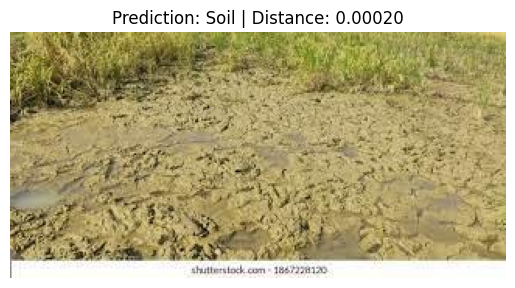

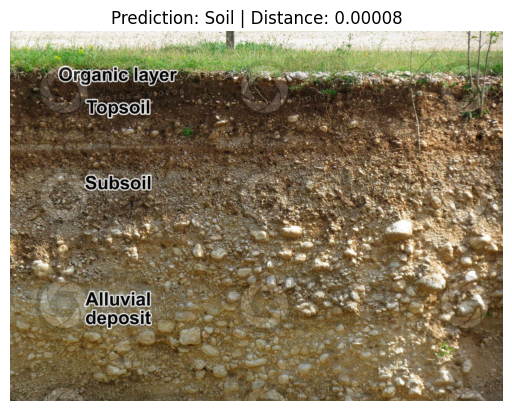

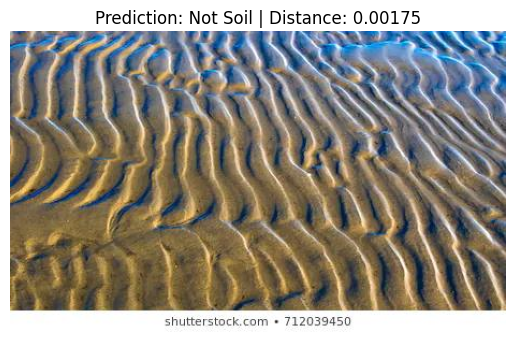

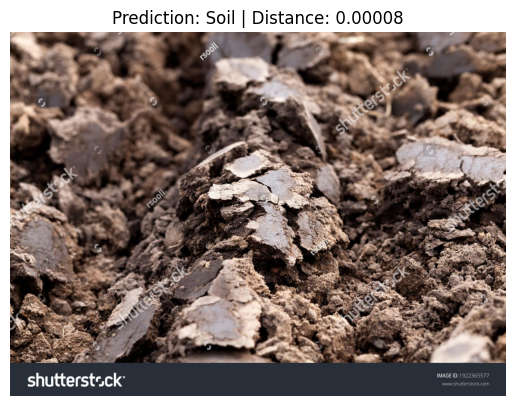

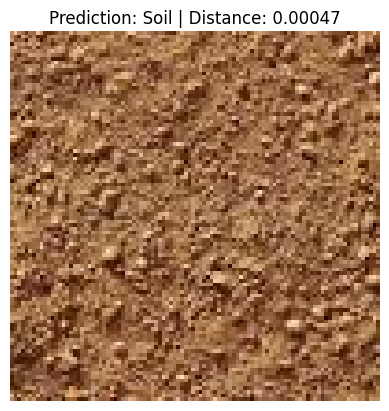

In [15]:
# Initialize evaluator with your model
evaluator = Evaluation(model=tinyvgg)

# Generate embeddings from training soil images
evaluator.generate_embeddings(train_dataloader)

# Classify test images using cosine distance
predictions_tinyvgg = evaluator.binary_classify(test_loader=test_loader, threshold=threshold_tiny_vgg,test_image_dir=test_images_dir, visualize=True)


In [16]:
test_df['label'] = predictions_tinyvgg
test_df.head()

,image_id,label
0,6595f1266325552489c7d1635fafb88f.jpg,1
1,4b614841803d5448b59e2c6ca74ea664.jpg,1
2,ca30e008692a50638b43d944f46245c8.jpg,0
3,6a9046a219425f7599729be627df1c1a.jpg,1
4,97c1e0276d2d5c2f88dddbc87357611e.jpg,1


## ViT Evaluation

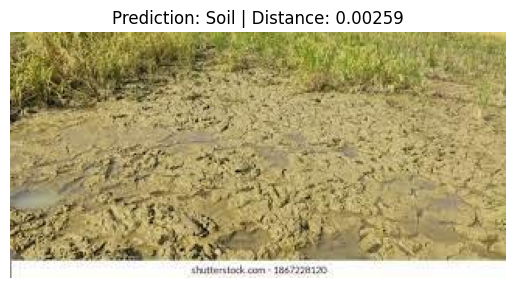

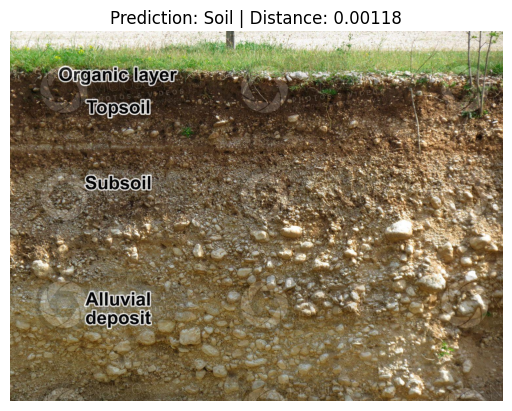

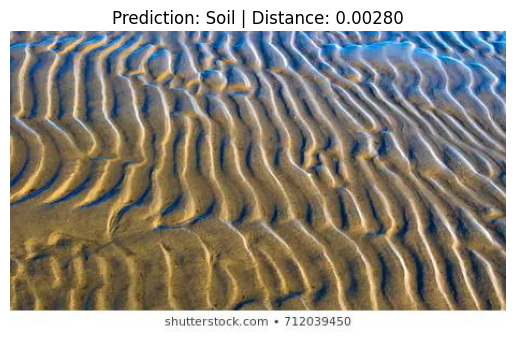

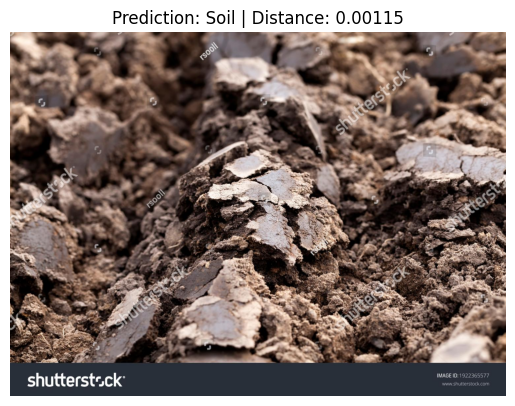

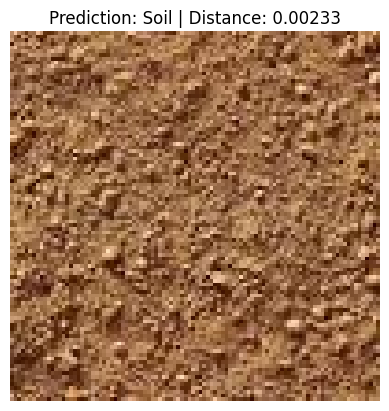

In [17]:
# Initialize evaluator with your model
evaluator = Evaluation(model=vit)

# Generate embeddings from training soil images
evaluator.generate_embeddings(train_dataloader)

# Classify test images using cosine distance
predictions_vit = evaluator.binary_classify(test_loader=test_loader, threshold=threshold_vit,test_image_dir = test_images_dir, visualize=True)


In [18]:
test_df['label'] = predictions_vit
test_df.head()

,image_id,label
0,6595f1266325552489c7d1635fafb88f.jpg,1
1,4b614841803d5448b59e2c6ca74ea664.jpg,1
2,ca30e008692a50638b43d944f46245c8.jpg,1
3,6a9046a219425f7599729be627df1c1a.jpg,1
4,97c1e0276d2d5c2f88dddbc87357611e.jpg,1


# Comparision

In [19]:
# Assuming both predictions are lists of same length
differences = []
idxs = []

for i, (pred_tiny, pred_vit) in enumerate(zip(predictions_tinyvgg, predictions_vit)):
    if pred_tiny != pred_vit:
        differences.append((i, pred_tiny, pred_vit))

# Print the differences
print(f"Total differences: {len(differences)}\n")
for idx, tiny_pred, vit_pred in differences:
    print(f"Index {idx}: TinyVGG = {tiny_pred}, ViT = {vit_pred}")
    idxs.append(idx)


Total differences: 24

Index 2: TinyVGG = 0, ViT = 1
Index 9: TinyVGG = 0, ViT = 1
Index 14: TinyVGG = 0, ViT = 1
Index 18: TinyVGG = 0, ViT = 1
Index 20: TinyVGG = 0, ViT = 1
Index 23: TinyVGG = 0, ViT = 1
Index 47: TinyVGG = 0, ViT = 1
Index 49: TinyVGG = 0, ViT = 1
Index 52: TinyVGG = 0, ViT = 1
Index 74: TinyVGG = 0, ViT = 1
Index 85: TinyVGG = 0, ViT = 1
Index 125: TinyVGG = 0, ViT = 1
Index 139: TinyVGG = 0, ViT = 1
Index 144: TinyVGG = 0, ViT = 1
Index 151: TinyVGG = 0, ViT = 1
Index 157: TinyVGG = 0, ViT = 1
Index 191: TinyVGG = 0, ViT = 1
Index 194: TinyVGG = 0, ViT = 1
Index 199: TinyVGG = 0, ViT = 1
Index 201: TinyVGG = 0, ViT = 1
Index 203: TinyVGG = 0, ViT = 1
Index 205: TinyVGG = 0, ViT = 1
Index 212: TinyVGG = 0, ViT = 1
Index 221: TinyVGG = 0, ViT = 1


In [20]:
from pathlib import Path
import matplotlib.pyplot as plt

In [23]:
from pathlib import Path
import matplotlib.pyplot as plt
from PIL import Image

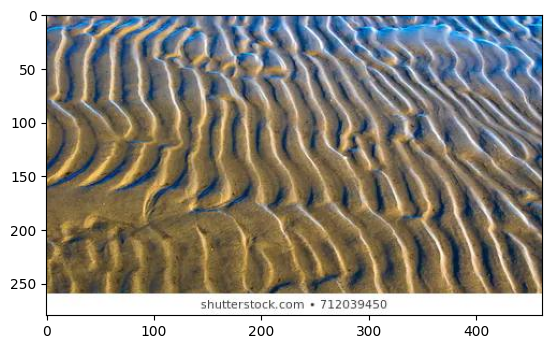

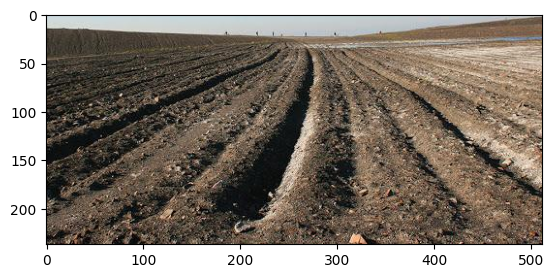

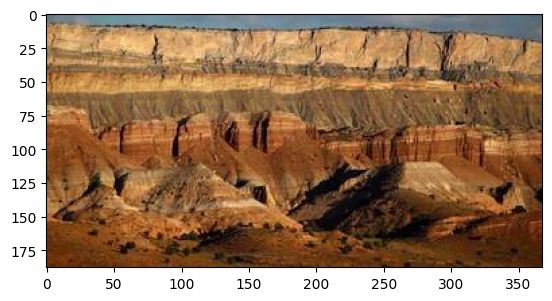

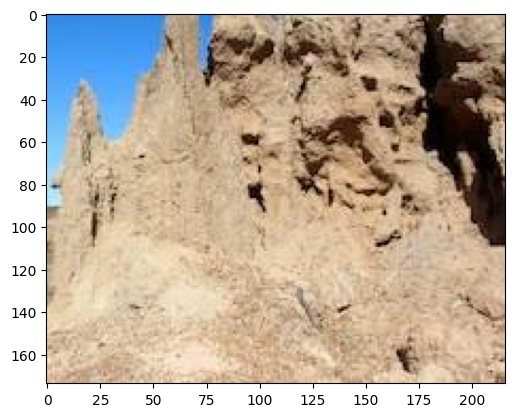

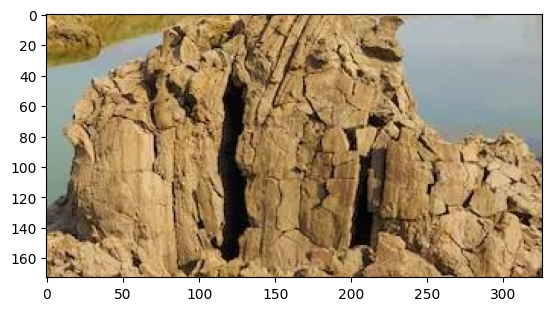

...

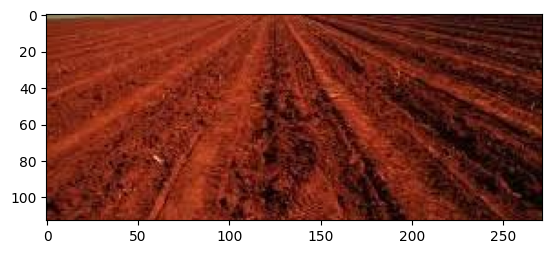

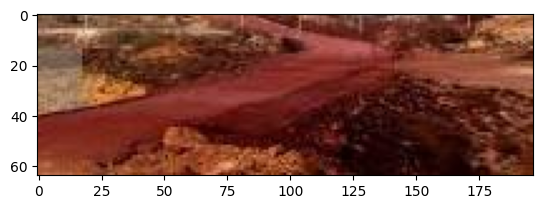

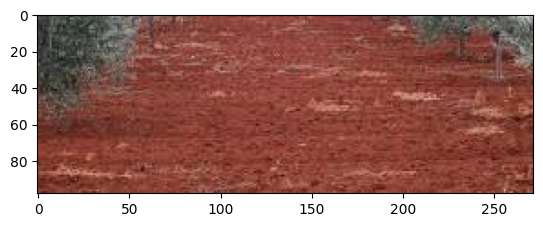

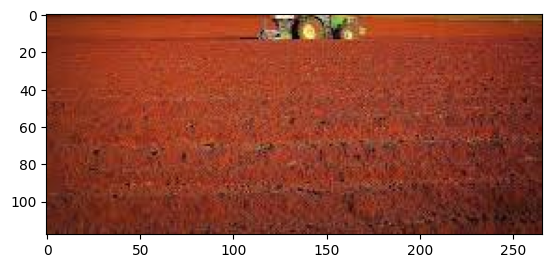

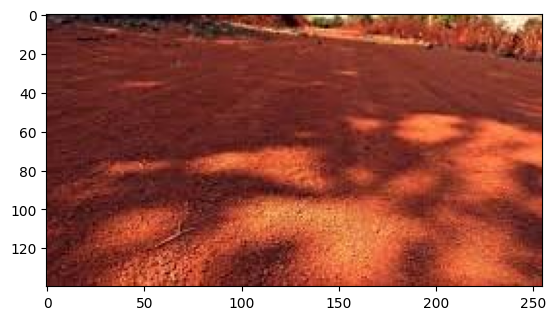

In [24]:
# Show in which images tinyvgg got wrong
for index,row in test_df.iterrows():
    if index in idxs:
        image_id = row['image_id']
        image_path = Path(test_images_dir) / image_id 
        img = Image.open(image_path).convert('RGB')
        plt.imshow(img)
        plt.show()

## Achitecture PNG save

In [26]:
!pip install torchinfo

^C



[notice] A new release of pip is available: 25.0.1 -> 25.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [ ]:
from torchinfo import summary
summary(tinyvgg, input_size=(1, 3, 224, 224))

Layer (type:depth-idx)                   Output Shape              Param #
TinyVGG_FeatureExtractor                 [1, 31360]                --
├─Sequential: 1-1                        [1, 10, 112, 112]         --
│    └─Conv2d: 2-1                       [1, 10, 224, 224]         (1,480)
│    └─ReLU: 2-2                         [1, 10, 224, 224]         --
│    └─Conv2d: 2-3                       [1, 10, 224, 224]         (4,910)
│    └─ReLU: 2-4                         [1, 10, 224, 224]         --
│    └─MaxPool2d: 2-5                    [1, 10, 112, 112]         --
├─Sequential: 1-2                        [1, 10, 56, 56]           --
│    └─Conv2d: 2-6                       [1, 10, 112, 112]         (4,910)
│    └─ReLU: 2-7                         [1, 10, 112, 112]         --
│    └─Conv2d: 2-8                       [1, 10, 112, 112]         (4,910)
│    └─ReLU: 2-9                         [1, 10, 112, 112]         --
│    └─MaxPool2d: 2-10                   [1, 10, 56, 56]         

In [ ]:
summary(vit, input_size=(1, 3, 224, 224))


Layer (type:depth-idx)                        Output Shape              Param #
VisionTransformer                             [1, 1000]                 768
├─Conv2d: 1-1                                 [1, 768, 14, 14]          (590,592)
├─Encoder: 1-2                                [1, 197, 768]             151,296
│    └─Dropout: 2-1                           [1, 197, 768]             --
│    └─Sequential: 2-2                        [1, 197, 768]             --
│    │    └─EncoderBlock: 3-1                 [1, 197, 768]             (7,087,872)
│    │    └─EncoderBlock: 3-2                 [1, 197, 768]             (7,087,872)
│    │    └─EncoderBlock: 3-3                 [1, 197, 768]             (7,087,872)
│    │    └─EncoderBlock: 3-4                 [1, 197, 768]             (7,087,872)
│    │    └─EncoderBlock: 3-5                 [1, 197, 768]             (7,087,872)
│    │    └─EncoderBlock: 3-6                 [1, 197, 768]             (7,087,872)
│    │    └─EncoderBlock: 3-

# Conclusion

In this project, we addressed the Soil Classification Challenge 2 using a one-class classification approach. By leveraging high-dimensional embeddings from pretrained models (TinyVGG and Vision Transformer), we were able to effectively distinguish soil images from non-soil images based on cosine similarity.

Key findings:
- **TinyVGG and ViT embeddings** both provided strong representations for anomaly detection.
- **Cosine similarity thresholding** enabled robust binary classification without requiring negative samples during training.
- The pipeline is flexible and can be adapted to similar anomaly detection tasks in computer vision.

Future improvements could include experimenting with other backbone architectures, fine-tuning on soil data, or exploring alternative distance metrics for classification.

Overall, this approach demonstrates the power of transfer learning and embedding-based anomaly detection for real-world image classification challenges.